-------

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import platform
from matplotlib import rc

system = platform.system()
if system == 'Darwin':  
    rc('font', family='AppleGothic') # 한국어 깨짐 방지용


plt.rcParams['axes.unicode_minus'] = False # 마이너스 기호 깨짐 방지용

In [2]:
act = pd.read_csv("/Users/leehyunsong/Desktop/최종프로젝트/헬스케어/라이프로그/라이프로그 시각화/total_act.csv")
mmse = pd.read_csv("/Users/leehyunsong/Desktop/최종프로젝트/헬스케어/라이프로그/라이프로그 시각화/total_mmse.csv")
sleep = pd.read_csv("/Users/leehyunsong/Desktop/최종프로젝트/헬스케어/라이프로그/라이프로그 시각화/total_slp.csv")

---

# 전처리

1. 날짜형 컬럼 가시성 있게 변환

In [3]:
act.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12183 entries, 0 to 12182
Data columns (total 32 columns):
 #   Column                                   Non-Null Count  Dtype  
---  ------                                   --------------  -----  
 0   EMAIL                                    12183 non-null  object 
 1   activity_average_met                     12183 non-null  float64
 2   activity_cal_active                      12183 non-null  int64  
 3   activity_cal_total                       12183 non-null  int64  
 4   activity_class_5min                      12183 non-null  object 
 5   activity_daily_movement                  12183 non-null  int64  
 6   activity_day_end                         12183 non-null  object 
 7   activity_day_start                       12183 non-null  object 
 8   activity_high                            12183 non-null  int64  
 9   activity_inactive                        12183 non-null  int64  
 10  activity_inactivity_alerts               12183

In [4]:
act.columns

Index(['EMAIL', 'activity_average_met', 'activity_cal_active',
       'activity_cal_total', 'activity_class_5min', 'activity_daily_movement',
       'activity_day_end', 'activity_day_start', 'activity_high',
       'activity_inactive', 'activity_inactivity_alerts', 'activity_low',
       'activity_medium', 'activity_met_1min', 'activity_met_min_high',
       'activity_met_min_inactive', 'activity_met_min_low',
       'activity_met_min_medium', 'activity_non_wear', 'activity_rest',
       'activity_score', 'activity_score_meet_daily_targets',
       'activity_score_move_every_hour', 'activity_score_recovery_time',
       'activity_score_stay_active', 'activity_score_training_frequency',
       'activity_score_training_volume', 'activity_steps', 'activity_total',
       'CONVERT(activity_class_5min USING utf8)',
       'CONVERT(activity_met_1min USING utf8)', 'DIAG_NM'],
      dtype='object')

In [5]:
mmse.columns

Index(['EMAIL', 'DIAG_SEQ', 'DOCTOR_NM', 'MMSE_NUM', 'MMSE_KIND', 'Q01', 'Q02',
       'Q03', 'Q04', 'Q05', 'Q06', 'Q07', 'Q08', 'Q09', 'Q10', 'Q11_1',
       'Q11_2', 'Q11_3', 'Q12_1', 'Q12_2', 'Q12_3', 'Q12_4', 'Q12_5',
       'Q12_TOTAL', 'Q13_1', 'Q13_2', 'Q13_3', 'Q14_1', 'Q14_2', 'Q15',
       'Q16_1', 'Q16_2', 'Q16_3', 'Q17', 'Q18', 'Q19', 'TOTAL', 'DIAG_NM'],
      dtype='object')

In [6]:
sleep.columns

Index(['EMAIL', 'sleep_awake', 'sleep_bedtime_end', 'sleep_bedtime_start',
       'sleep_breath_average', 'sleep_deep', 'sleep_duration',
       'sleep_efficiency', 'sleep_hr_5min', 'sleep_hr_average',
       'sleep_hr_lowest', 'sleep_hypnogram_5min', 'sleep_is_longest',
       'sleep_light', 'sleep_midpoint_at_delta', 'sleep_midpoint_time',
       'sleep_onset_latency', 'sleep_period_id', 'sleep_rem', 'sleep_restless',
       'sleep_rmssd', 'sleep_rmssd_5min', 'sleep_score',
       'sleep_score_alignment', 'sleep_score_deep', 'sleep_score_disturbances',
       'sleep_score_efficiency', 'sleep_score_latency', 'sleep_score_rem',
       'sleep_score_total', 'sleep_temperature_delta',
       'sleep_temperature_deviation', 'sleep_total',
       'CONVERT(sleep_hr_5min USING utf8)',
       'CONVERT(sleep_hypnogram_5min USING utf8)',
       'CONVERT(sleep_rmssd_5min USING utf8)', 'DIAG_NM'],
      dtype='object')

In [7]:
act['activity_day_start'] = pd.to_datetime(act['activity_day_start'])
act['activity_day_start'] = act['activity_day_start'].dt.strftime('%Y-%m-%d %H:%M:%S')

In [8]:
act['activity_day_end'] = pd.to_datetime(act['activity_day_end'])
act['activity_day_end'] = act['activity_day_end'].dt.strftime('%Y-%m-%d %H:%M:%S')

In [9]:
sleep['sleep_bedtime_end'] = pd.to_datetime(sleep['sleep_bedtime_end'])
sleep['sleep_bedtime_end'] = sleep['sleep_bedtime_end'].dt.strftime('%Y-%m-%d %H:%M:%S')

In [10]:
sleep['sleep_bedtime_start'] = pd.to_datetime(sleep['sleep_bedtime_start'])
sleep['sleep_bedtime_start'] = sleep['sleep_bedtime_start'].dt.strftime('%Y-%m-%d %H:%M:%S')


----

2. act CONVERT 열 처리하고 삭제

In [11]:
act['activity_class_5min']

0        ...
1        ...
2        ...
3        ...
4        ...
        ... 
12178    ...
12179    ...
12180    ...
12181    ...
12182    ...
Name: activity_class_5min, Length: 12183, dtype: object

In [12]:
act['activity_class_5min'].unique()

array(['...'], dtype=object)

-> 빈 컬럼 확인

In [13]:
act['5_count'] = act['CONVERT(activity_class_5min USING utf8)'].apply(lambda x: len(str(x).split('/')))
act['5_count'].value_counts().reset_index()

,5_count,count
0,289,12011
1,288,21
2,287,14
3,286,14
4,285,11
...,...,...
71,164,1
72,133,1
73,218,1
74,78,1


In [14]:
act['activity_class_5min'] = act['CONVERT(activity_class_5min USING utf8)'].apply(
    lambda x: [float(i) for i in x.split('/') if i.strip().isdigit()] if isinstance(x, str) else []
)


In [15]:
act['activity_class_5min']

0        [1.0, 1.0, 2.0, 2.0, 2.0, 2.0, 1.0, 1.0, 1.0, ...
1        [1.0, 1.0, 1.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, ...
2        [1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ...
3        [1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ...
4        [1.0, 1.0, 1.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, ...
                               ...                        
12178    [1.0, 2.0, 1.0, 1.0, 1.0, 2.0, 2.0, 3.0, 3.0, ...
12179    [1.0, 1.0, 1.0, 1.0, 1.0, 2.0, 2.0, 2.0, 3.0, ...
12180    [3.0, 3.0, 3.0, 3.0, 3.0, 2.0, 3.0, 3.0, 2.0, ...
12181    [1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ...
12182    [1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ...
Name: activity_class_5min, Length: 12183, dtype: object

-> 5분 기록 처리 완료

In [16]:
act['activity_met_1min']

0        ...
1        ...
2        ...
3        ...
4        ...
        ... 
12178    ...
12179    ...
12180    ...
12181    ...
12182    ...
Name: activity_met_1min, Length: 12183, dtype: object

In [17]:
act['activity_met_1min'].unique()

array(['...'], dtype=object)

-> 빈 컬럼 확인

In [18]:
act['1_count'] = act['CONVERT(activity_met_1min USING utf8)'].apply(lambda x: len(str(x).split('/')))
act['1_count'].value_counts().reset_index()

,1_count,count
0,1441,12183


In [19]:
act['activity_met_1min'] = act['CONVERT(activity_met_1min USING utf8)'].apply(
    lambda x: [float(i) for i in x.split('/') if i.strip() not in ['', None]] if isinstance(x, str) else []
)

In [20]:
act['activity_met_1min']

0        [1.2, 0.9, 1.0, 0.9, 0.9, 0.9, 0.9, 0.9, 0.9, ...
1        [0.9, 0.9, 1.3, 1.0, 0.9, 0.9, 1.1, 0.9, 1.0, ...
2        [0.9, 0.9, 0.9, 0.9, 0.9, 0.9, 0.9, 0.9, 0.9, ...
3        [0.9, 0.9, 0.9, 0.9, 0.9, 0.9, 0.9, 0.9, 0.9, ...
4        [0.9, 0.9, 0.9, 0.9, 0.9, 0.9, 0.9, 0.9, 0.9, ...
                               ...                        
12178    [1.2, 0.9, 0.9, 0.9, 1.1, 1.1, 0.9, 1.1, 2.4, ...
12179    [0.9, 0.9, 0.9, 0.9, 0.9, 0.9, 0.9, 0.9, 0.9, ...
12180    [2.1, 1.9, 2.2, 2.4, 2.8, 2.2, 1.9, 1.7, 1.9, ...
12181    [0.9, 0.9, 0.9, 0.9, 0.9, 0.9, 0.9, 0.9, 0.9, ...
12182    [1.3, 0.9, 0.9, 0.9, 0.9, 0.9, 0.9, 0.9, 0.9, ...
Name: activity_met_1min, Length: 12183, dtype: object

-> 1분 기록 처리 완료

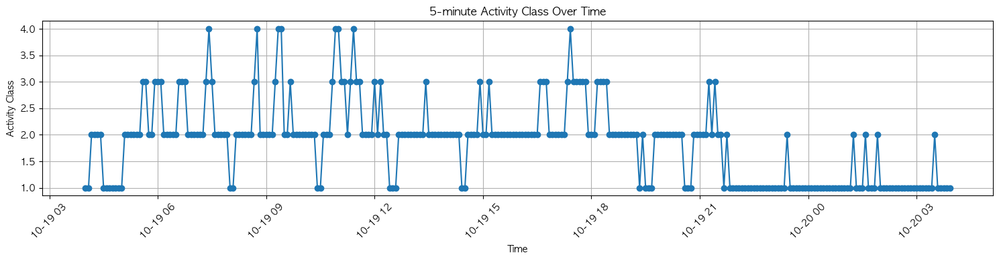

In [21]:
import pandas as pd
import matplotlib.pyplot as plt


row = act.iloc[0]


activity_data = row['activity_class_5min']


start_time = pd.to_datetime(row['activity_day_start'])


timestamps = pd.date_range(start=start_time, periods=len(activity_data),freq='5T')


activity_df = pd.DataFrame({
    'timestamp': timestamps,
    'activity_class': activity_data
})


plt.figure(figsize=(15, 4))
plt.plot(activity_df['timestamp'], activity_df['activity_class'], marker='o')
plt.title('5-minute Activity Class Over Time')
plt.xlabel('Time')
plt.ylabel('Activity Class')
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()


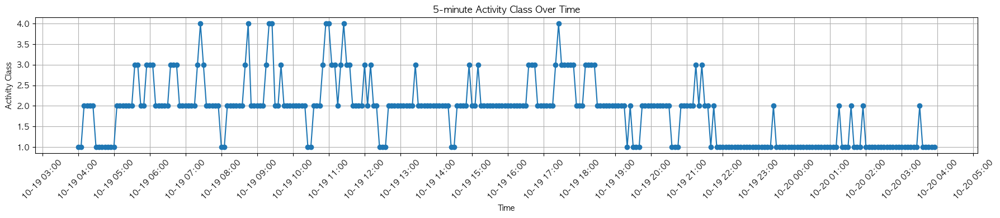

In [22]:
import matplotlib.pyplot as plt
import matplotlib.dates as mdates

fig, ax = plt.subplots(figsize=(18, 4))

ax.plot(timestamps, activity_data, marker='o', linestyle='-')
ax.set_title("5-minute Activity Class Over Time")
ax.set_xlabel("Time")
ax.set_ylabel("Activity Class")


ax.xaxis.set_major_locator(mdates.HourLocator(interval=1)) 
ax.xaxis.set_major_formatter(mdates.DateFormatter('%m-%d %H:%M')) 

plt.xticks(rotation=45)
plt.tight_layout()
plt.grid(True)
plt.show()


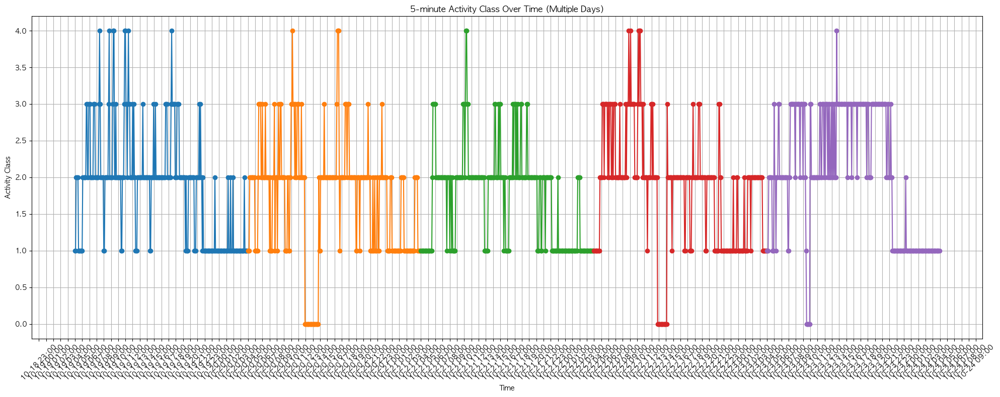

In [23]:
import pandas as pd
import matplotlib.pyplot as plt


subset_df = act[0:5]


all_activity_df = []

for idx, row in subset_df.iterrows():
    activity_data = row['activity_class_5min']
    start_time = pd.to_datetime(row['activity_day_start'])

    
    timestamps = pd.date_range(start=start_time, periods=len(activity_data), freq='5T')

   
    activity_df = pd.DataFrame({
        'timestamp': timestamps,
        'activity_class': activity_data,
        'index': idx 
    })

    all_activity_df.append(activity_df)


combined_df = pd.concat(all_activity_df)


plt.figure(figsize=(20, 8))


for idx in combined_df['index'].unique():
    sub_df = combined_df[combined_df['index'] == idx]
    plt.plot(sub_df['timestamp'], sub_df['activity_class'], marker='o')

plt.title('5-minute Activity Class Over Time (Multiple Days)')
plt.xlabel('Time')
plt.ylabel('Activity Class')
plt.grid(True)
plt.gca().xaxis.set_major_locator(mdates.HourLocator(interval=1))  
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%m-%d %H:%M'))  
plt.xticks(rotation=45)

plt.tight_layout()
plt.show()


In [24]:
act.drop(columns=['CONVERT(activity_met_1min USING utf8)', 'CONVERT(activity_class_5min USING utf8)', '1_count', '5_count'], inplace = True)

----

3. sleep CONVERT 열 처리하고 삭제

In [25]:
sleep.columns

Index(['EMAIL', 'sleep_awake', 'sleep_bedtime_end', 'sleep_bedtime_start',
       'sleep_breath_average', 'sleep_deep', 'sleep_duration',
       'sleep_efficiency', 'sleep_hr_5min', 'sleep_hr_average',
       'sleep_hr_lowest', 'sleep_hypnogram_5min', 'sleep_is_longest',
       'sleep_light', 'sleep_midpoint_at_delta', 'sleep_midpoint_time',
       'sleep_onset_latency', 'sleep_period_id', 'sleep_rem', 'sleep_restless',
       'sleep_rmssd', 'sleep_rmssd_5min', 'sleep_score',
       'sleep_score_alignment', 'sleep_score_deep', 'sleep_score_disturbances',
       'sleep_score_efficiency', 'sleep_score_latency', 'sleep_score_rem',
       'sleep_score_total', 'sleep_temperature_delta',
       'sleep_temperature_deviation', 'sleep_total',
       'CONVERT(sleep_hr_5min USING utf8)',
       'CONVERT(sleep_hypnogram_5min USING utf8)',
       'CONVERT(sleep_rmssd_5min USING utf8)', 'DIAG_NM'],
      dtype='object')

In [26]:
sleep['sleep_hr_5min']

0        ...
1        ...
2        ...
3        ...
4        ...
        ... 
12178    ...
12179    ...
12180    ...
12181    ...
12182    ...
Name: sleep_hr_5min, Length: 12183, dtype: object

In [27]:
sleep['sleep_hr_5min'].unique()

array(['...'], dtype=object)

-> 빈 컬럼 확인

In [28]:
sleep['5_count'] = sleep['CONVERT(sleep_hr_5min USING utf8)'].apply(lambda x: len(str(x).split('/')))
sleep['5_count'].value_counts().reset_index()

,5_count,count
0,95,256
1,97,245
2,98,242
3,102,239
4,96,239
...,...,...
138,180,2
139,181,2
140,41,1
141,179,1


In [29]:
sleep['sleep_hr_5min'] = sleep['CONVERT(sleep_hr_5min USING utf8)'].apply(
    lambda x: [float(i) for i in x.split('/') if i.strip() not in ['', None]] if isinstance(x, str) else []
)

In [30]:
sleep['sleep_hr_5min']

0        [63.0, 61.0, 59.0, 58.0, 58.0, 58.0, 56.0, 55....
1        [0.0, 51.0, 0.0, 51.0, 52.0, 52.0, 52.0, 52.0,...
2        [54.0, 56.0, 0.0, 55.0, 53.0, 55.0, 56.0, 55.0...
3        [0.0, 54.0, 53.0, 53.0, 54.0, 54.0, 54.0, 53.0...
4        [0.0, 49.0, 50.0, 50.0, 50.0, 50.0, 50.0, 50.0...
                               ...                        
12178    [66.0, 66.0, 65.0, 64.0, 65.0, 65.0, 65.0, 63....
12179    [66.0, 0.0, 0.0, 69.0, 69.0, 69.0, 67.0, 65.0,...
12180    [63.0, 63.0, 63.0, 62.0, 63.0, 62.0, 62.0, 62....
12181    [0.0, 72.0, 71.0, 70.0, 68.0, 69.0, 69.0, 68.0...
12182    [0.0, 0.0, 0.0, 0.0, 64.0, 66.0, 66.0, 65.0, 6...
Name: sleep_hr_5min, Length: 12183, dtype: object

-> 5분 수면 심박수 처리 완료

In [31]:
sleep['sleep_hypnogram_5min']

0        ...
1        ...
2        ...
3        ...
4        ...
        ... 
12178    ...
12179    ...
12180    ...
12181    ...
12182    ...
Name: sleep_hypnogram_5min, Length: 12183, dtype: object

In [32]:
sleep['sleep_hypnogram_5min'].unique()

array(['...'], dtype=object)

-> 빈 배열 확인

In [33]:
sleep['5h_count'] = sleep['CONVERT(sleep_hypnogram_5min USING utf8)'].apply(lambda x: len(str(x).split('/')))
sleep['5h_count'].value_counts().reset_index()

,5h_count,count
0,95,249
1,99,245
2,96,243
3,103,240
4,102,240
...,...,...
137,173,3
138,41,2
139,180,2
140,38,1


In [34]:
sleep['sleep_hypnogram_5min'] = sleep['CONVERT(sleep_hypnogram_5min USING utf8)'].apply(
    lambda x: [float(i) for i in x.split('/') if i.strip() not in ['', None]] if isinstance(x, str) else []
)

In [35]:
sleep['sleep_hypnogram_5min']

0        [4.0, 2.0, 2.0, 2.0, 2.0, 1.0, 1.0, 2.0, 2.0, ...
1        [4.0, 2.0, 4.0, 2.0, 2.0, 2.0, 1.0, 1.0, 1.0, ...
2        [4.0, 2.0, 1.0, 1.0, 2.0, 2.0, 4.0, 4.0, 4.0, ...
3        [4.0, 4.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ...
4        [4.0, 2.0, 2.0, 2.0, 2.0, 1.0, 1.0, 1.0, 2.0, ...
                               ...                        
12178    [4.0, 2.0, 4.0, 4.0, 2.0, 2.0, 2.0, 2.0, 3.0, ...
12179    [4.0, 2.0, 4.0, 2.0, 1.0, 4.0, 2.0, 2.0, 2.0, ...
12180    [4.0, 2.0, 2.0, 2.0, 2.0, 2.0, 1.0, 1.0, 1.0, ...
12181    [4.0, 2.0, 2.0, 4.0, 4.0, 2.0, 1.0, 1.0, 4.0, ...
12182    [4.0, 4.0, 4.0, 4.0, 2.0, 2.0, 2.0, 1.0, 1.0, ...
Name: sleep_hypnogram_5min, Length: 12183, dtype: object

-> 5분 수면 상태 처리 완료

In [36]:
sleep['sleep_rmssd_5min']

0        ...
1        ...
2        ...
3        ...
4        ...
        ... 
12178    ...
12179    ...
12180    ...
12181    ...
12182    ...
Name: sleep_rmssd_5min, Length: 12183, dtype: object

In [37]:
sleep['sleep_rmssd_5min'].unique()

array(['...'], dtype=object)

-> 빈 배열 확인

In [38]:
sleep['5r_count'] = sleep['CONVERT(sleep_rmssd_5min USING utf8)'].apply(lambda x: len(str(x).split('/')))
sleep['5r_count'].value_counts().reset_index()

,5r_count,count
0,95,256
1,97,245
2,98,242
3,102,239
4,96,239
...,...,...
138,180,2
139,181,2
140,41,1
141,179,1


In [39]:
sleep['sleep_rmssd_5min'] = sleep['CONVERT(sleep_rmssd_5min USING utf8)'].apply(
    lambda x: [float(i) for i in x.split('/') if i.strip() not in ['', None]] if isinstance(x, str) else []
)

In [40]:
sleep['sleep_rmssd_5min']

0        [18.0, 28.0, 25.0, 28.0, 34.0, 34.0, 35.0, 45....
1        [0.0, 49.0, 0.0, 38.0, 51.0, 17.0, 18.0, 18.0,...
2        [56.0, 47.0, 0.0, 49.0, 42.0, 57.0, 44.0, 49.0...
3        [0.0, 40.0, 40.0, 40.0, 37.0, 46.0, 35.0, 46.0...
4        [0.0, 81.0, 60.0, 74.0, 62.0, 63.0, 56.0, 78.0...
                               ...                        
12178    [45.0, 35.0, 29.0, 27.0, 34.0, 30.0, 31.0, 32....
12179    [21.0, 0.0, 0.0, 30.0, 31.0, 35.0, 35.0, 29.0,...
12180    [29.0, 28.0, 28.0, 32.0, 27.0, 35.0, 34.0, 36....
12181    [0.0, 19.0, 14.0, 14.0, 22.0, 20.0, 22.0, 22.0...
12182    [0.0, 0.0, 0.0, 0.0, 25.0, 31.0, 33.0, 35.0, 3...
Name: sleep_rmssd_5min, Length: 12183, dtype: object

-> 5분 수면 심박변동 처리 완료

In [41]:
sleep.drop(columns=['CONVERT(sleep_hypnogram_5min USING utf8)', 'CONVERT(sleep_rmssd_5min USING utf8)','CONVERT(sleep_hypnogram_5min USING utf8)', '5_count', '5h_count', '5r_count'], inplace = True)

----

- 컬럼명 전처리

In [42]:
dict = {
    'EMAIL': '이메일',
    'activity_average_met': '하루 평균 운동 강도',
    'activity_cal_active': '하루간 활동 칼로리',
    'activity_cal_total': '하루간 총 사용 칼로리',
    'activity_class_5min': '하루간 5분당 활동 로그',
    'activity_daily_movement': '하루동안 움직인 거리',
    'activity_day_end': '활동 종료 시간',
    'activity_day_start': '활동 시작 시간',
    'activity_high': '고강도 활동 시간',
    'activity_inactive': '비활동 시간',
    'activity_inactivity_alerts': '비활동 알람 횟수',
    'activity_low': '저강도 활동 시간',
    'activity_medium': '중강도 활동 시간',
    'activity_met_1min': '하루간 분당 운동 강도 로그',
    'activity_met_min_high': '하루간 고강도 운동 강도',
    'activity_met_min_inactive': '하루간 비활동 운동 강도',
    'activity_met_min_low': '하루간 저강도 활동 운동 강도',
    'activity_met_min_medium': '하루간 중강도 활동 운동 강도',
    'activity_non_wear': '미착용 시간',
    'activity_rest': '휴식 시간',
    'activity_score': '활동 점수',
    'activity_score_meet_daily_targets': '활동 목표달성 점수',
    'activity_score_move_every_hour': '매 시간 당 활동유지 점수',
    'activity_score_recovery_time': '회복시간 점수',
    'activity_score_stay_active': '활동 유지 점수',
    'activity_score_training_frequency': '운동 빈도 점수',
    'activity_score_training_volume': '운동량 점수',
    'activity_steps': '매일 걸음 수',
    'activity_total': '활동 총 시간',
    'DIAG_NM' : '진단'
}

act = act.rename(columns= dict)

In [43]:
act['진단'].unique()

array(['MCI', 'CN', 'Dem'], dtype=object)

In [44]:
act['진단'] = act['진단'].apply(lambda x: '정상' if x == 'CN' else '치매')

----

/Users/leehyunsong/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


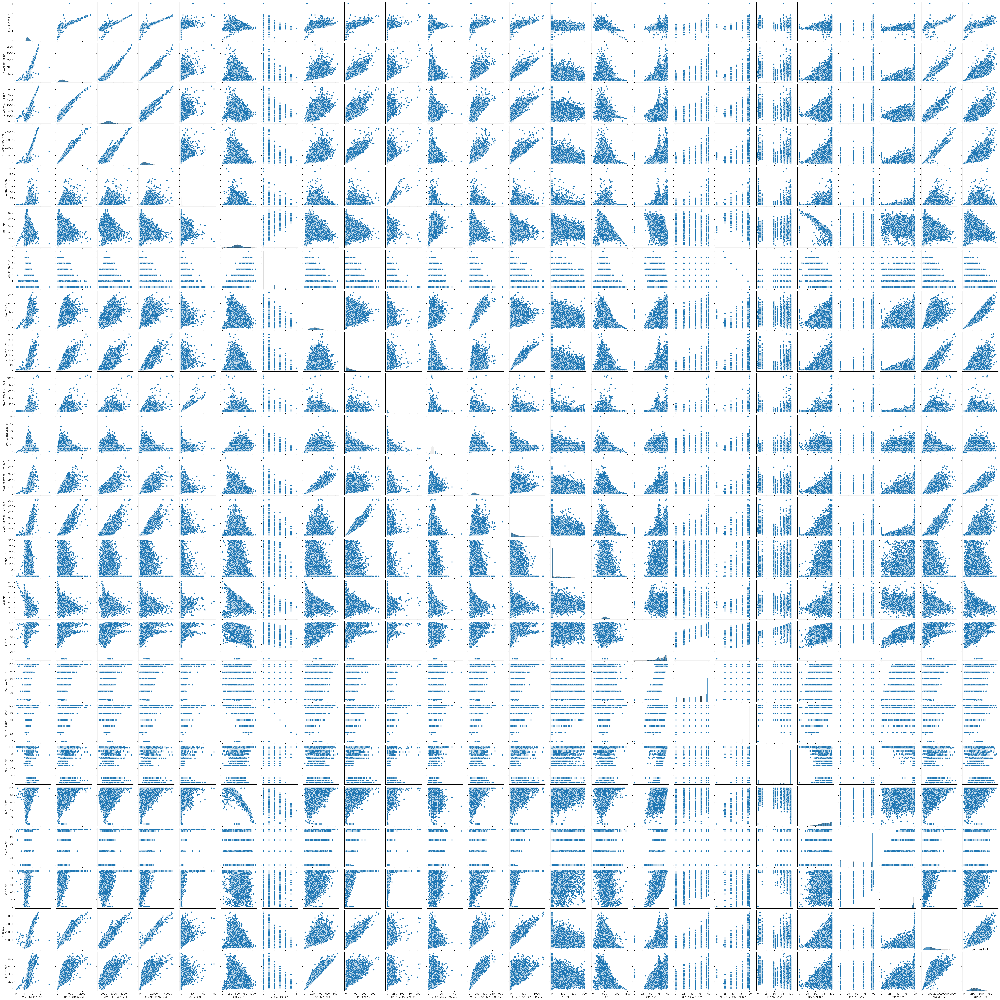

In [45]:
sns.pairplot(act)
plt.title("act Pair Plot")
plt.show()

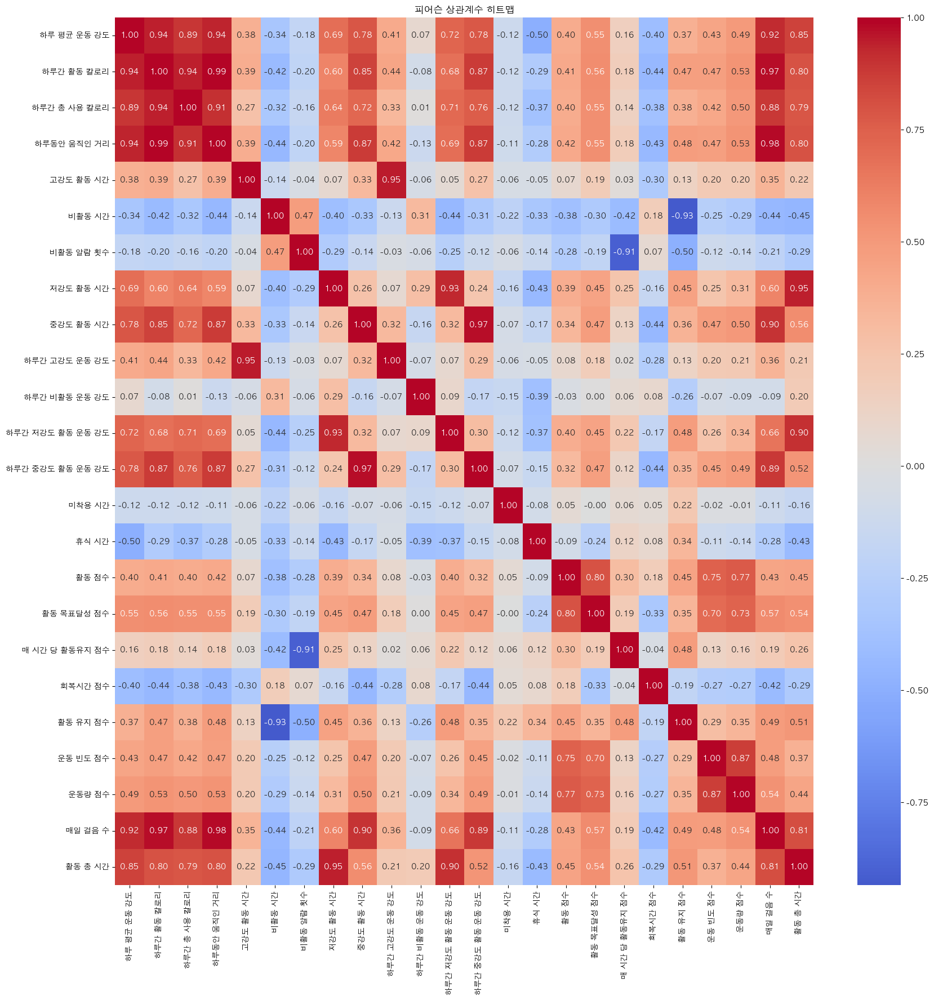

In [46]:
corr = act.corr(numeric_only=True, method='pearson')


plt.figure(figsize=(20, 20))
sns.heatmap(corr, annot=True, fmt=".2f", cmap='coolwarm', center=0)
plt.title('피어슨 상관계수 히트맵')
plt.show()

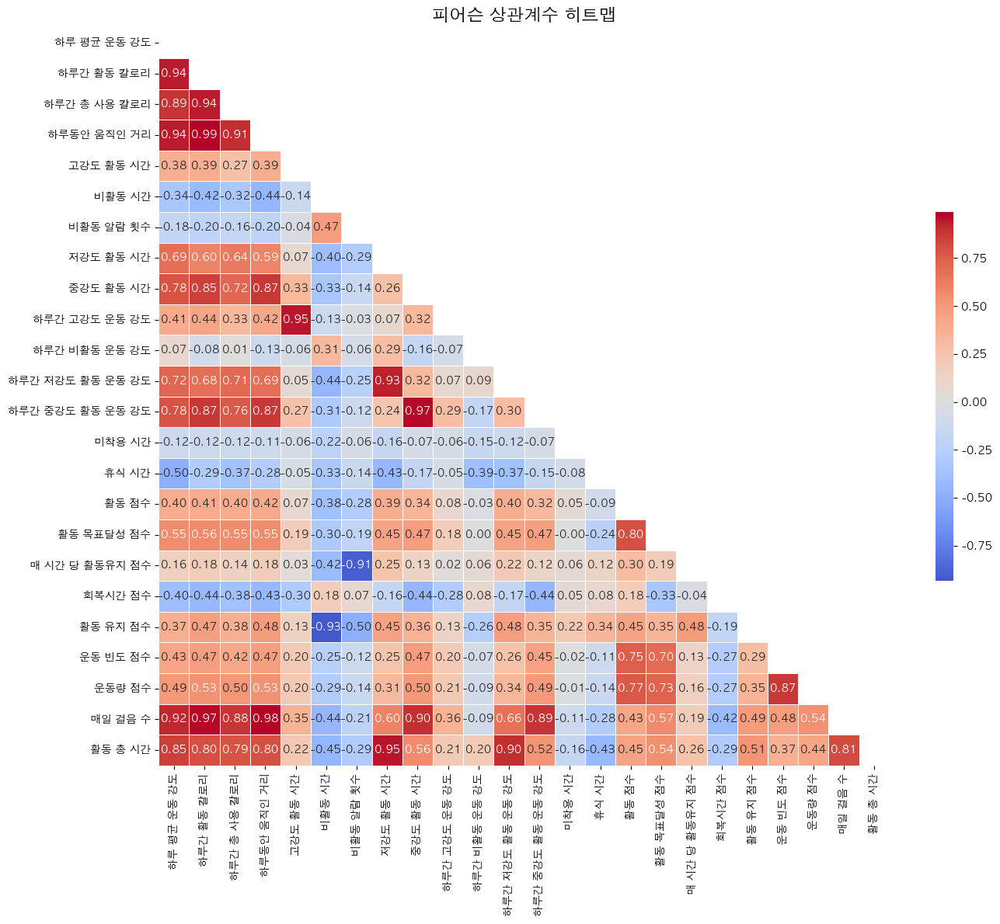

In [47]:
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# 상관계수 행렬
corr = act.corr(numeric_only=True, method='pearson')

# 마스크 생성 (상삼각을 True로 설정하여 숨김)
mask = np.triu(np.ones_like(corr, dtype=bool))

# 히트맵 시각화
plt.figure(figsize=(14, 12))
sns.heatmap(corr, 
            mask=mask,       # 👈 상삼각 가리기
            annot=True, 
            fmt=".2f", 
            cmap='coolwarm', 
            center=0,
            linewidths=0.5, 
            cbar_kws={"shrink": .5})  # colorbar 크기 줄이기

plt.title('피어슨 상관계수 히트맵', fontsize=16)
plt.xticks(rotation=90)
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()


----

- 비활동 알람 횟수 별 운동량 비교

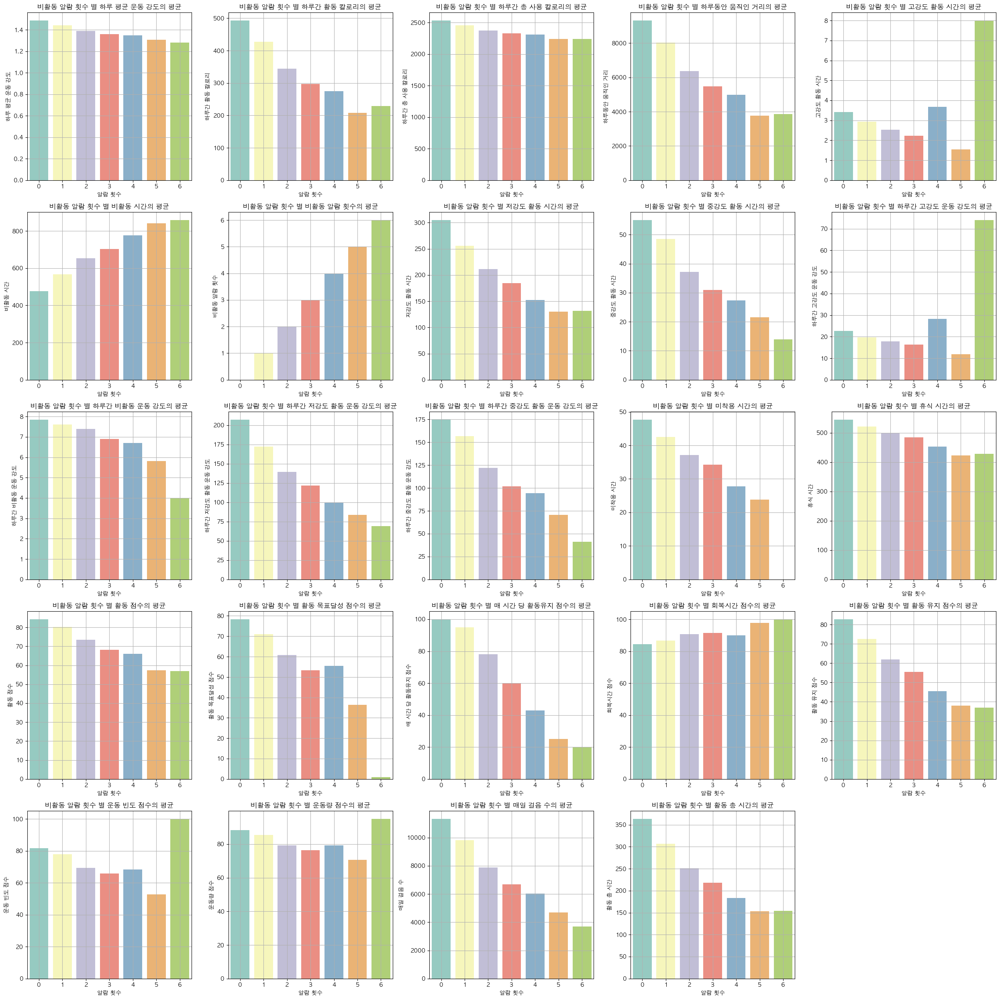

In [48]:
# 평균치 비교
import matplotlib.pyplot as plt
import seaborn as sns
import math

n = len(act.select_dtypes(include='number').columns)

cols = math.ceil(math.sqrt(n))
rows = math.ceil(n / cols)

fig, axes = plt.subplots(rows, cols, figsize=(cols*5, rows*5))
axes = axes.flatten()

for i, col in enumerate(act.select_dtypes(include='number').columns):
    alert_mean = act.groupby('비활동 알람 횟수')[col].mean()
    sns.barplot(x = alert_mean.index, y = alert_mean.values, palette='Set3', ax=axes[i])
    axes[i].set_title(f'비활동 알람 횟수 별 {col}의 평균')
    axes[i].set_xlabel("알람 횟수")
    axes[i].set_ylabel(f'{col}')
    axes[i].grid(True)

for j in range(i+1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

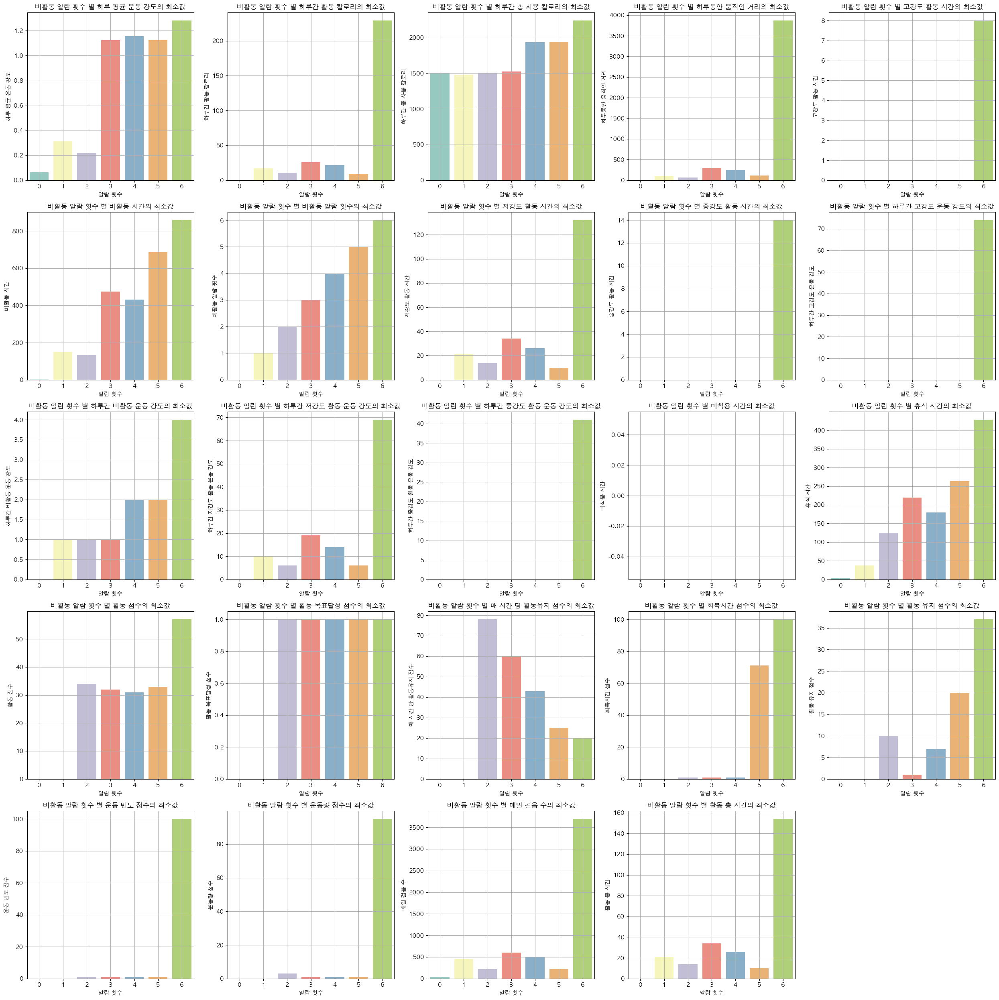

In [49]:
# 최소값 비교
import matplotlib.pyplot as plt
import seaborn as sns
import math

n = len(act.select_dtypes(include='number').columns)

cols = math.ceil(math.sqrt(n))
rows = math.ceil(n / cols)

fig, axes = plt.subplots(rows, cols, figsize=(cols*5, rows*5))
axes = axes.flatten()

for i, col in enumerate(act.select_dtypes(include='number').columns):
    alert_min = act.groupby('비활동 알람 횟수')[col].min()
    sns.barplot(x = alert_min.index, y = alert_min.values, palette='Set3', ax=axes[i])
    axes[i].set_title(f'비활동 알람 횟수 별 {col}의 최소값')
    axes[i].set_xlabel("알람 횟수")
    axes[i].set_ylabel(f'{col}')
    axes[i].grid(True)

for j in range(i+1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

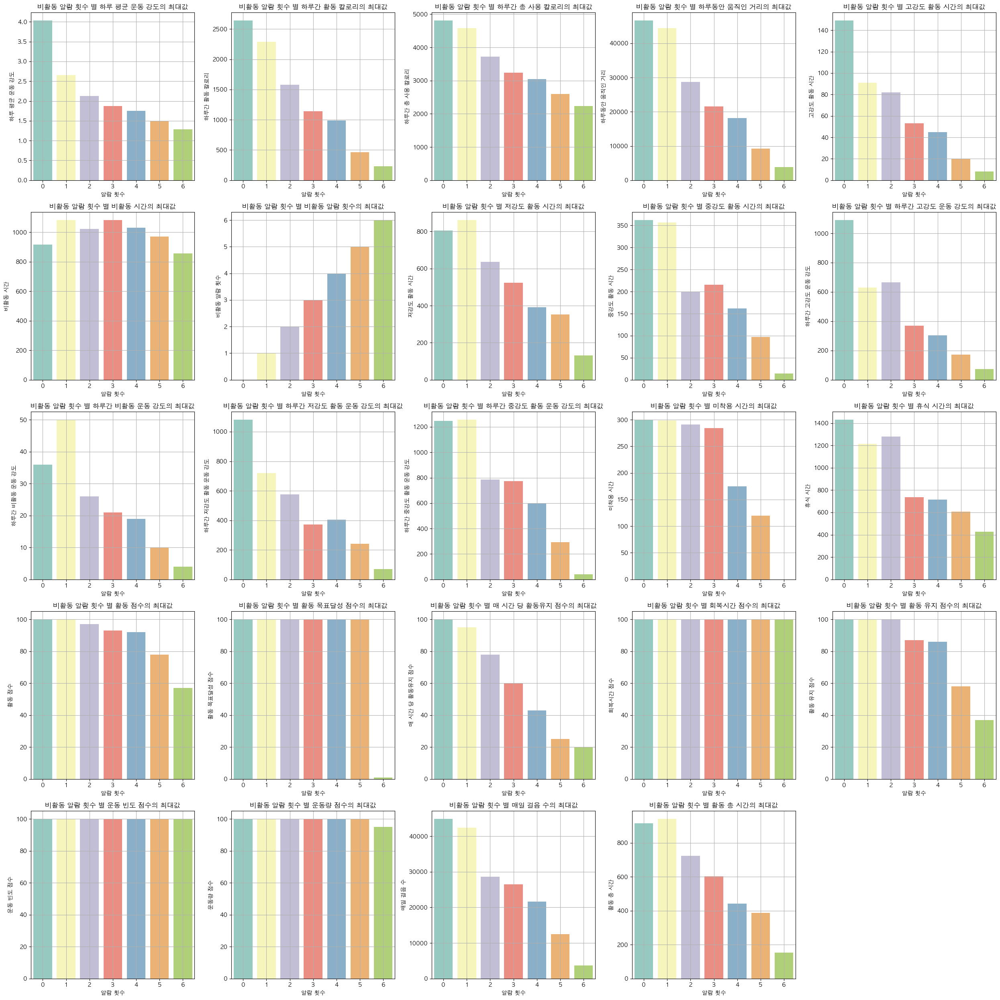

In [50]:
# 최대값 비교
import matplotlib.pyplot as plt
import seaborn as sns
import math

n = len(act.select_dtypes(include='number').columns)

cols = math.ceil(math.sqrt(n))
rows = math.ceil(n / cols)

fig, axes = plt.subplots(rows, cols, figsize=(cols*5, rows*5))
axes = axes.flatten()

for i, col in enumerate(act.select_dtypes(include='number').columns):
    alert_max = act.groupby('비활동 알람 횟수')[col].max()
    sns.barplot(x = alert_max.index, y = alert_max.values, palette='Set3', ax=axes[i])
    axes[i].set_title(f'비활동 알람 횟수 별 {col}의 최대값')
    axes[i].set_xlabel("알람 횟수")
    axes[i].set_ylabel(f'{col}')
    axes[i].grid(True)

for j in range(i+1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

---

- 운동 시간 별 휴식 시간 비교 

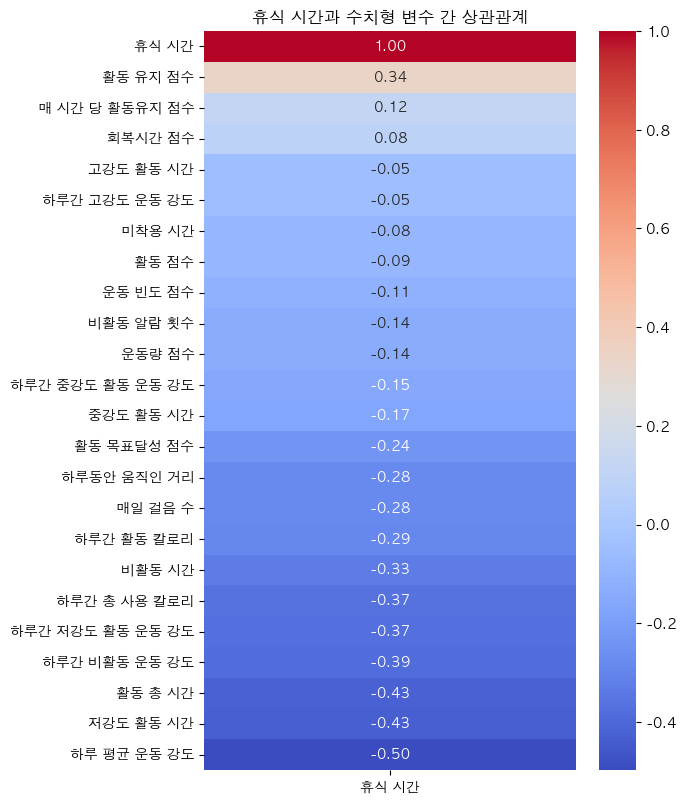

In [51]:
import seaborn as sns
import matplotlib.pyplot as plt


numeric_cols = act.select_dtypes(include='number')


corr = numeric_cols.corr()
rest_corr = corr[['휴식 시간']].sort_values(by='휴식 시간', ascending=False)


plt.figure(figsize=(6, len(rest_corr) * 0.4))
sns.heatmap(rest_corr, annot=True, cmap='coolwarm', fmt=".2f")
plt.title("휴식 시간과 수치형 변수 간 상관관계")
plt.show()


In [52]:
act['휴식 시간'].describe()

count    12183.000000
mean       533.476402
std        130.260837
min          3.000000
25%        453.000000
50%        526.000000
75%        605.000000
max       1430.000000
Name: 휴식 시간, dtype: float64

In [53]:
act['휴식시간대'] = (act['휴식 시간'] // 60).astype(int)

In [54]:
act['휴식시간대'].describe()

count    12183.000000
mean         8.393335
std          2.187807
min          0.000000
25%          7.000000
50%          8.000000
75%         10.000000
max         23.000000
Name: 휴식시간대, dtype: float64

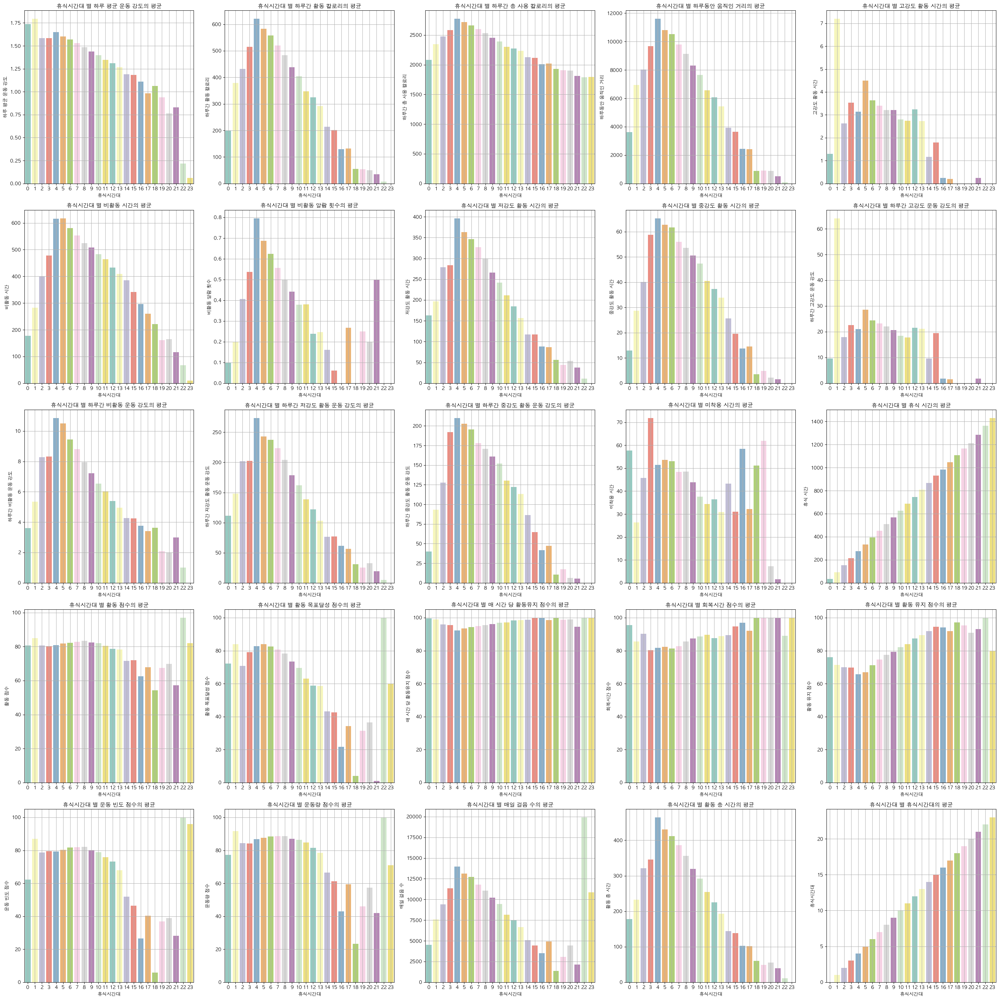

In [55]:
# 평균치 비교
import matplotlib.pyplot as plt
import seaborn as sns
import math

n = len(act.select_dtypes(include='number').columns)

cols = math.ceil(math.sqrt(n))
rows = math.ceil(n / cols)

fig, axes = plt.subplots(rows, cols, figsize=(cols*6, rows*6))
axes = axes.flatten()

for i, col in enumerate(act.select_dtypes(include='number').columns):
    alert_mean = act.groupby('휴식시간대')[col].mean()
    sns.barplot(x = alert_mean.index, y = alert_mean.values, palette='Set3', ax=axes[i])
    axes[i].set_title(f'휴식시간대 별 {col}의 평균')
    axes[i].set_xlabel("휴식시간대")
    axes[i].set_ylabel(f'{col}')
    axes[i].grid(True)

for j in range(i+1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

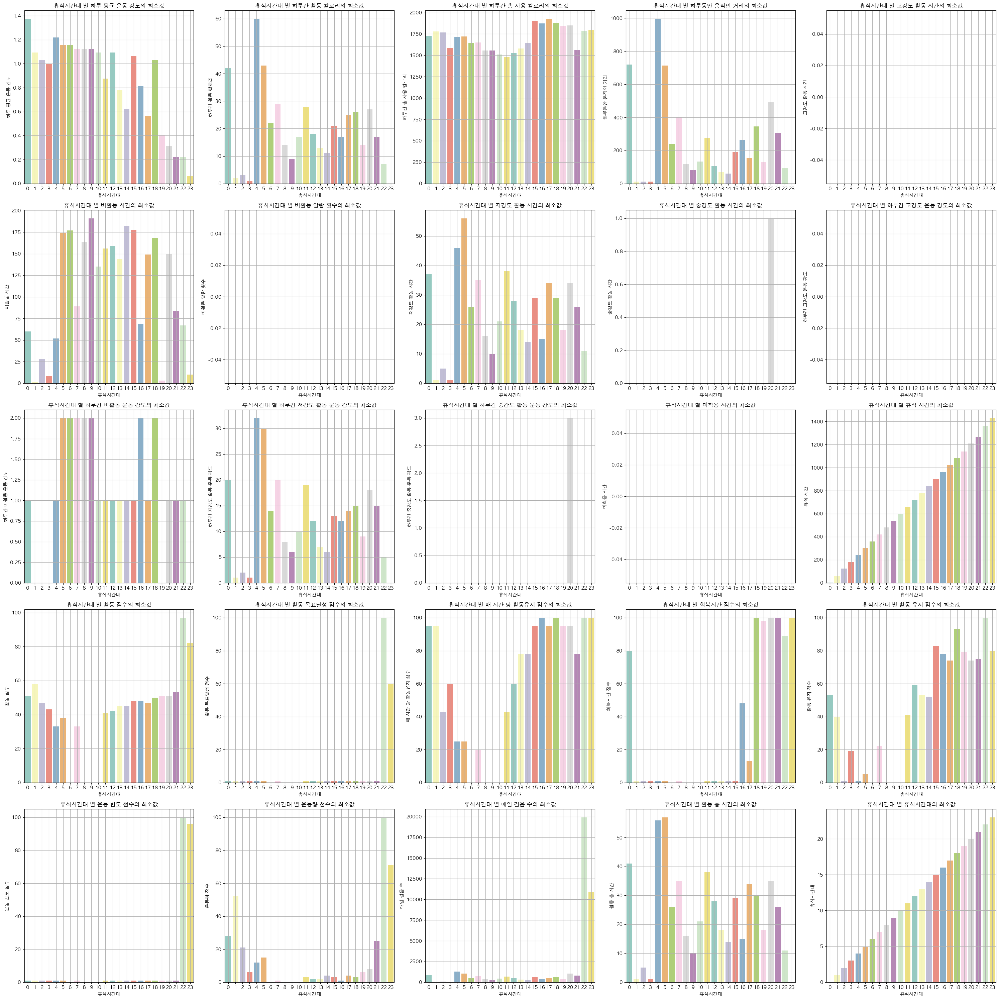

In [56]:
# 최소값 비교
import matplotlib.pyplot as plt
import seaborn as sns
import math

n = len(act.select_dtypes(include='number').columns)

cols = math.ceil(math.sqrt(n))
rows = math.ceil(n / cols)

fig, axes = plt.subplots(rows, cols, figsize=(cols*6, rows*6))
axes = axes.flatten()

for i, col in enumerate(act.select_dtypes(include='number').columns):
    alert_min = act.groupby('휴식시간대')[col].min()
    sns.barplot(x = alert_min.index, y = alert_min.values, palette='Set3', ax=axes[i])
    axes[i].set_title(f'휴식시간대 별 {col}의 최소값')
    axes[i].set_xlabel("휴식시간대")
    axes[i].set_ylabel(f'{col}')
    axes[i].grid(True)

for j in range(i+1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

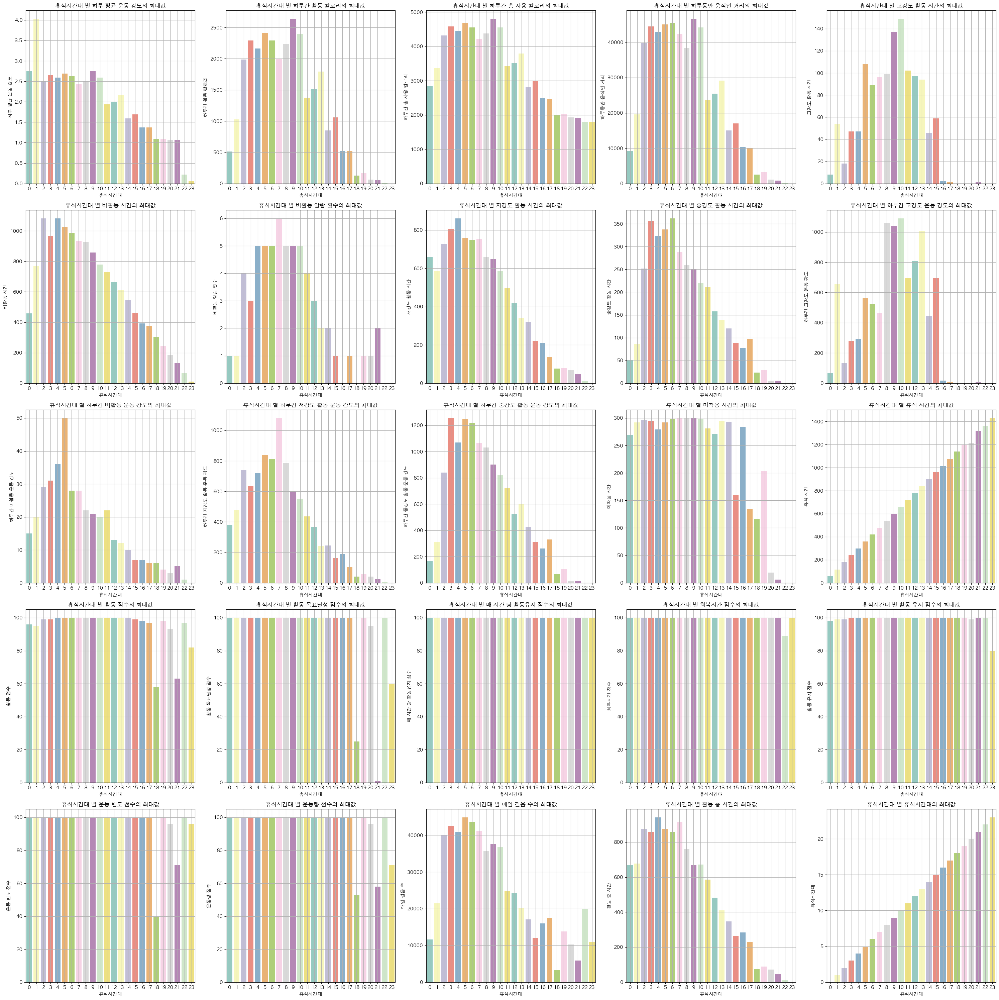

In [57]:
# 최대값 비교
import matplotlib.pyplot as plt
import seaborn as sns
import math

n = len(act.select_dtypes(include='number').columns)

cols = math.ceil(math.sqrt(n))
rows = math.ceil(n / cols)

fig, axes = plt.subplots(rows, cols, figsize=(cols*6, rows*6))
axes = axes.flatten()

for i, col in enumerate(act.select_dtypes(include='number').columns):
    alert_max = act.groupby('휴식시간대')[col].max()
    sns.barplot(x = alert_max.index, y = alert_max.values, palette='Set3', ax=axes[i])
    axes[i].set_title(f'휴식시간대 별 {col}의 최대값')
    axes[i].set_xlabel("휴식시간대")
    axes[i].set_ylabel(f'{col}')
    axes[i].grid(True)

for j in range(i+1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

In [58]:
act.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12183 entries, 0 to 12182
Data columns (total 31 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   이메일               12183 non-null  object 
 1   하루 평균 운동 강도       12183 non-null  float64
 2   하루간 활동 칼로리        12183 non-null  int64  
 3   하루간 총 사용 칼로리      12183 non-null  int64  
 4   하루간 5분당 활동 로그     12183 non-null  object 
 5   하루동안 움직인 거리       12183 non-null  int64  
 6   활동 종료 시간          12183 non-null  object 
 7   활동 시작 시간          12183 non-null  object 
 8   고강도 활동 시간         12183 non-null  int64  
 9   비활동 시간            12183 non-null  int64  
 10  비활동 알람 횟수         12183 non-null  int64  
 11  저강도 활동 시간         12183 non-null  int64  
 12  중강도 활동 시간         12183 non-null  int64  
 13  하루간 분당 운동 강도 로그   12183 non-null  object 
 14  하루간 고강도 운동 강도     12183 non-null  int64  
 15  하루간 비활동 운동 강도     12183 non-null  int64  
 16  하루간 저강도 활동 운동 강도  12183 non-null  int64 

In [59]:
act.describe()

,하루 평균 운동 강도,하루간 활동 칼로리,하루간 총 사용 칼로리,하루동안 움직인 거리,고강도 활동 시간,비활동 시간,비활동 알람 횟수,저강도 활동 시간,중강도 활동 시간,하루간 고강도 운동 강도,...,활동 점수,활동 목표달성 점수,매 시간 당 활동유지 점수,회복시간 점수,활동 유지 점수,운동 빈도 점수,운동량 점수,매일 걸음 수,활동 총 시간,휴식시간대
count,12183.000000,12183.000000,12183.000000,12183.000000,12183.000000,12183.000000,12183.000000,12183.000000,12183.000000,12183.000000,...,12183.000000,12183.000000,12183.000000,12183.000000,12183.000000,12183.000000,12183.000000,12183.000000,12183.000000,12183.000000
mean,1.464043,460.459493,2496.414676,8678.383403,3.212099,517.293442,0.477715,282.636214,51.464089,21.536649,...,81.995650,74.569892,95.827382,85.715423,77.921694,79.410654,86.649676,10577.850529,337.312403,8.393335
std,0.189910,265.929813,349.307513,5215.388700,7.661274,138.630642,0.794813,120.397014,43.604840,50.054722,...,14.322392,32.846664,9.745194,29.724801,15.664736,34.100382,21.379994,5795.562044,139.954197,2.187807
min,0.062500,0.000000,1478.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,41.000000,0.000000,0.000000
25%,1.343750,261.500000,2266.000000,4750.000000,0.000000,423.000000,0.000000,193.000000,17.000000,0.000000,...,73.000000,60.000000,95.000000,89.000000,68.000000,71.000000,83.000000,6184.000000,235.000000,7.000000
50%,1.437500,419.000000,2472.000000,7894.000000,1.000000,511.000000,0.000000,273.000000,42.000000,7.000000,...,86.000000,95.000000,100.000000,100.000000,80.000000,100.000000,97.000000,9815.000000,328.000000,8.000000
75%,1.562500,610.000000,2710.500000,11673.000000,3.000000,605.000000,1.000000,358.000000,76.000000,22.000000,...,94.000000,100.000000,100.000000,100.000000,91.000000,100.000000,100.000000,14202.500000,427.000000,10.000000
max,4.031250,2640.000000,4808.000000,46659.000000,149.000000,1082.000000,6.000000,861.000000,362.000000,1090.000000,...,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,44836.000000,941.000000,23.000000


In [60]:
# 활동 로그 데이터
activity_cols = [
    '하루 평균 운동 강도',
    '하루간 활동 칼로리',
    '하루간 총 사용 칼로리',
    '하루동안 움직인 거리',
    '고강도 활동 시간',
    '비활동 시간',
    '비활동 알람 횟수',
    '저강도 활동 시간',
    '중강도 활동 시간',
    '하루간 고강도 운동 강도',
    '하루간 비활동 운동 강도',
    '하루간 저강도 활동 운동 강도',
    '하루간 중강도 활동 운동 강도',
    '미착용 시간',
    '휴식 시간',
    '활동 점수',
    '활동 목표달성 점수',
    '매 시간 당 활동유지 점수',
    '회복시간 점수',
    '활동 유지 점수',
    '운동 빈도 점수',
    '운동량 점수',
    '매일 걸음 수',
    '활동 총 시간'
]

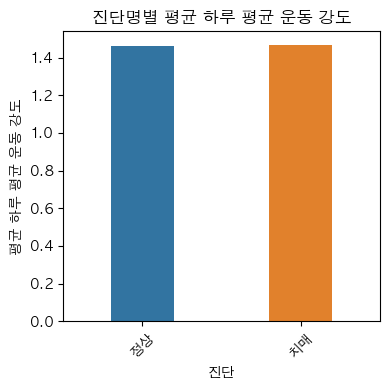

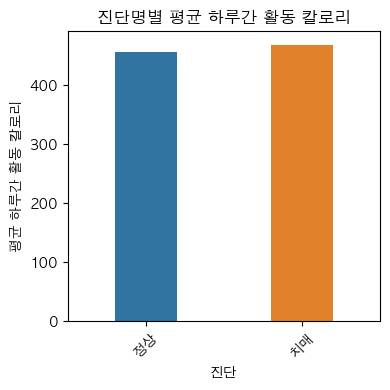

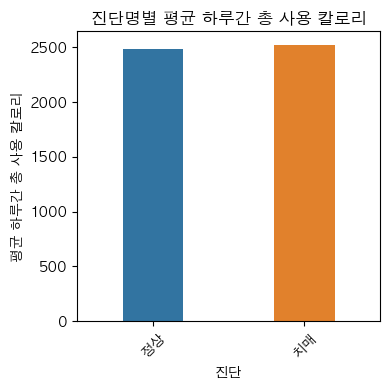

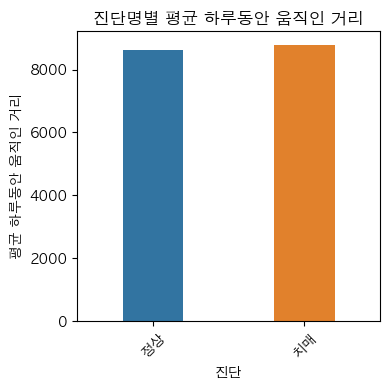

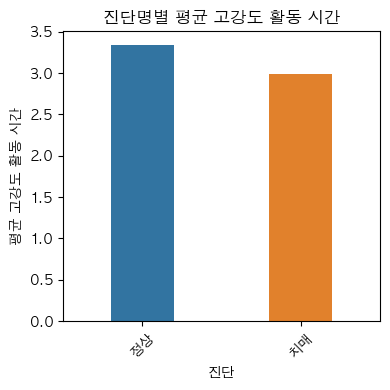

...

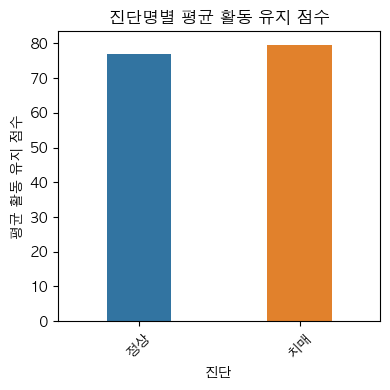

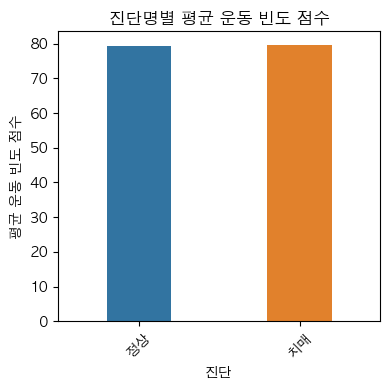

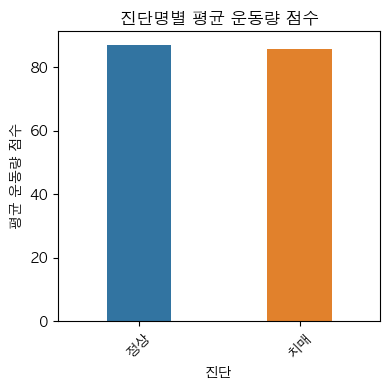

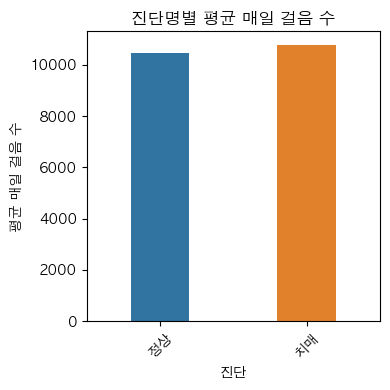

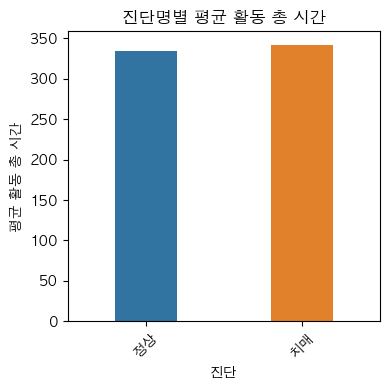

In [61]:
# 진단 타입별 평균 수치들
for col in activity_cols:
    # 그룹별 평균값 계산
    avg_df = act.groupby('진단')[col].mean().reset_index()

    # 시각화
    plt.figure(figsize=(4, 4))
    ax = sns.barplot(data=avg_df, x='진단', y=col, width=0.4)
    plt.title(f'진단명별 평균 {col.replace("_", " ")}')
    plt.xlabel('진단')
    plt.ylabel(f'평균 {col.replace("_", " ")}')
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

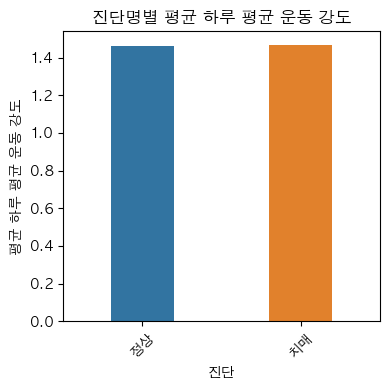

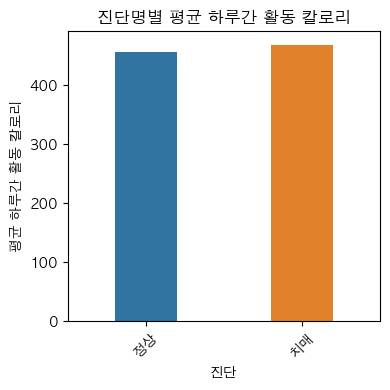

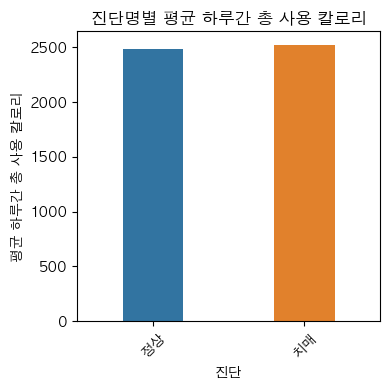

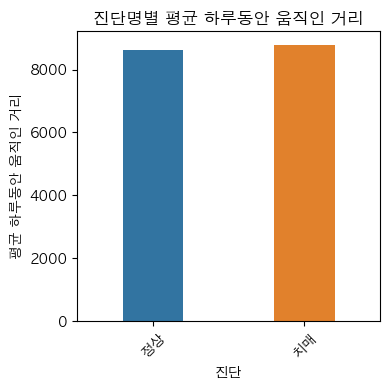

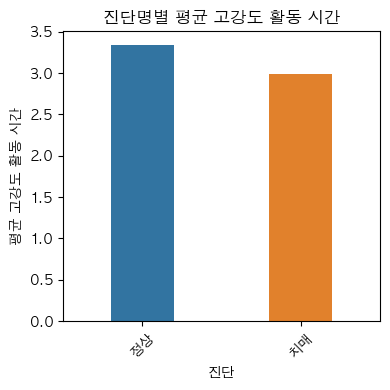

...

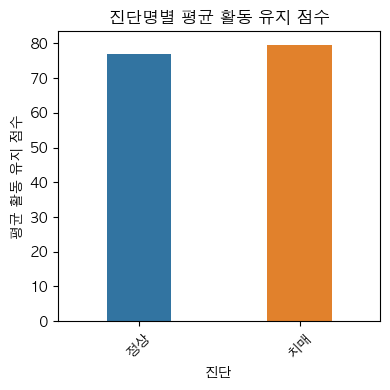

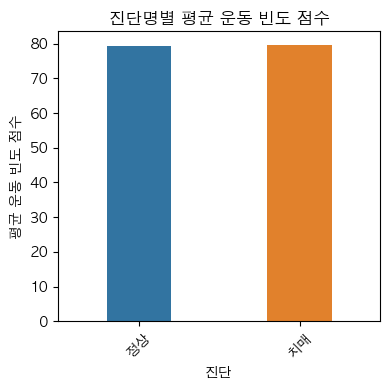

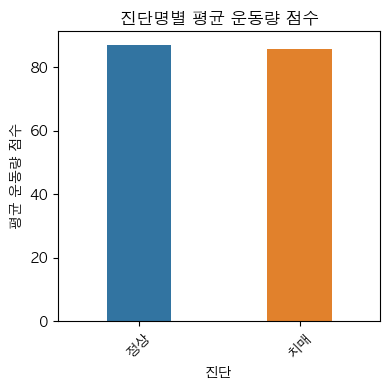

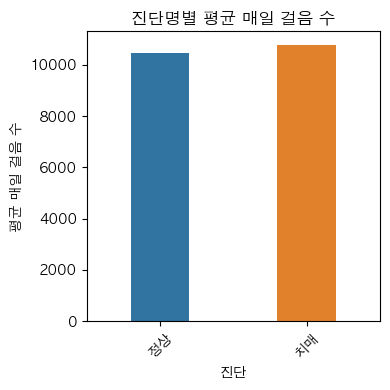

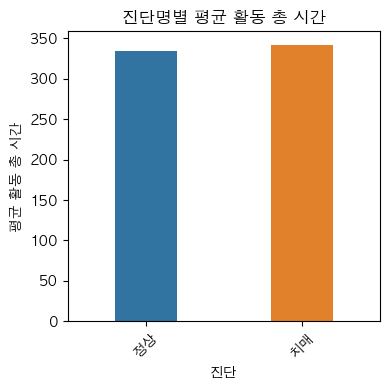

In [62]:
# 진단 타입별 평균 수치들
for col in activity_cols:
    # 그룹별 평균값 계산
    avg_df = act.groupby('진단')[col].mean().reset_index()

    # 시각화
    plt.figure(figsize=(4, 4))
    ax = sns.barplot(data=avg_df, x='진단', y=col, width=0.4)
    plt.title(f'진단명별 평균 {col.replace("_", " ")}')
    plt.xlabel('진단')
    plt.ylabel(f'평균 {col.replace("_", " ")}')
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

In [63]:
act['활동 종료 시간'] = pd.to_datetime(act['활동 종료 시간'])
act['활동 시작 시간'] = pd.to_datetime(act['활동 시작 시간'])

act['활동 시작 요일'] = act['활동 시작 시간'].dt.weekday

In [64]:
act.head()

,이메일,하루 평균 운동 강도,하루간 활동 칼로리,하루간 총 사용 칼로리,하루간 5분당 활동 로그,하루동안 움직인 거리,활동 종료 시간,활동 시작 시간,고강도 활동 시간,비활동 시간,...,매 시간 당 활동유지 점수,회복시간 점수,활동 유지 점수,운동 빈도 점수,운동량 점수,매일 걸음 수,활동 총 시간,진단,휴식시간대,활동 시작 요일
0,nia+279@rowan.kr,1.28125,196,2251,"[1.0, 1.0, 2.0, 2.0, 2.0, 2.0, 1.0, 1.0, 1.0, ...",3353,2020-10-20 03:59:59,2020-10-19 04:00:00,0,714,...,100,100,54,100,97,4212,207,치매,8,0
1,nia+279@rowan.kr,1.25000,145,2159,"[1.0, 1.0, 1.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, ...",2516,2020-10-21 03:59:59,2020-10-20 04:00:00,0,719,...,100,100,58,96,96,3306,140,치매,7,1
2,nia+279@rowan.kr,1.21875,118,2140,"[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ...",1716,2020-10-22 03:59:59,2020-10-21 04:00:00,0,708,...,95,100,55,71,83,2550,131,치매,10,2
3,nia+279@rowan.kr,1.28125,180,2240,"[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ...",2791,2020-10-23 03:59:59,2020-10-22 04:00:00,0,705,...,100,100,58,71,59,4009,208,치매,7,3
4,nia+279@rowan.kr,1.46875,374,2559,"[1.0, 1.0, 1.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, ...",5393,2020-10-24 03:59:59,2020-10-23 04:00:00,0,437,...,100,100,89,40,46,8081,517,치매,7,4


In [65]:
# 평일과 주말 운동량 비교
# 걸음수, 저강도~고강도 운동 시간
# 전체 운동 시간 (저강도~고강도)
act['총 활동 시간'] = act['저강도 활동 시간'] + act['중강도 활동 시간'] + act['고강도 활동 시간']
avg_act_time = act.groupby('활동 시작 요일')['총 활동 시간'].mean().reset_index().sort_values('활동 시작 요일')

In [66]:
# 요일별 평균 걸음 수
avg_steps = act.groupby('활동 시작 요일')['매일 걸음 수'].mean().reset_index().sort_values('활동 시작 요일')

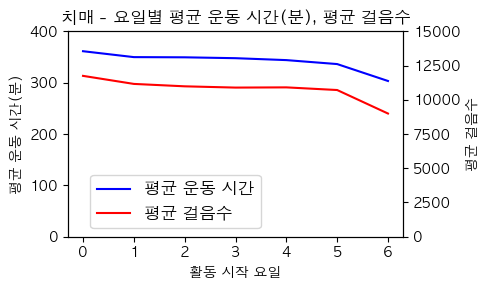

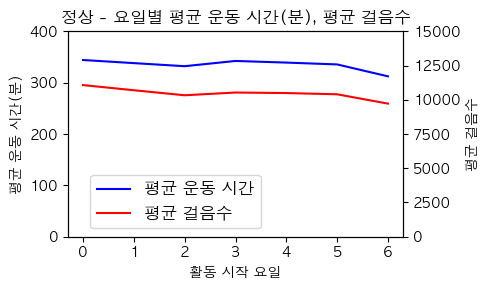

In [67]:
import seaborn as sns
import matplotlib.pyplot as plt

# 진단별로 그룹
act_dementia = act[act['진단'] == '치매']
act_normal = act[act['진단'] == '정상']

# '총 활동 시간'과 '매일 걸음 수'의 요일별 평균
avg_act_dementia = act_dementia.groupby('활동 시작 요일')['총 활동 시간'].mean().reset_index()
avg_steps_dementia = act_dementia.groupby('활동 시작 요일')['매일 걸음 수'].mean().reset_index()

avg_act_normal = act_normal.groupby('활동 시작 요일')['총 활동 시간'].mean().reset_index()
avg_steps_normal = act_normal.groupby('활동 시작 요일')['매일 걸음 수'].mean().reset_index()

# 1. 치매 환자
fig, ax1 = plt.subplots(figsize=(5,3))
line1 = ax1.plot(avg_act_dementia['활동 시작 요일'], 
                 avg_act_dementia['총 활동 시간'], 
                 color='b', label='평균 운동 시간')

ax1.set_xlabel('활동 시작 요일')
ax1.set_ylabel('평균 운동 시간(분)')
ax1.set_ylim(0, 400)
ax1.set_title('치매 - 요일별 평균 운동 시간(분), 평균 걸음수')

ax2 = ax1.twinx()
line2 = ax2.plot(avg_steps_dementia['활동 시작 요일'], 
                 avg_steps_dementia['매일 걸음 수'], 
                 color='r', label='평균 걸음수')
ax2.set_ylabel('평균 걸음수')
ax2.set_ylim(0, 15000)

lines = line1 + line2
labels = [l.get_label() for l in lines]
ax1.legend(lines, labels, loc='lower right', bbox_to_anchor=(0.6, 0), fontsize=12)
plt.tight_layout()
plt.show()


# 2. 정상군
fig, ax1 = plt.subplots(figsize=(5,3))
line1 = ax1.plot(avg_act_normal['활동 시작 요일'], 
                 avg_act_normal['총 활동 시간'], 
                 color='b', label='평균 운동 시간')

ax1.set_xlabel('활동 시작 요일')
ax1.set_ylabel('평균 운동 시간(분)')
ax1.set_ylim(0, 400)
ax1.set_title('정상 - 요일별 평균 운동 시간(분), 평균 걸음수')

ax2 = ax1.twinx()
line2 = ax2.plot(avg_steps_normal['활동 시작 요일'], 
                 avg_steps_normal['매일 걸음 수'], 
                 color='r', label='평균 걸음수')
ax2.set_ylabel('평균 걸음수')
ax2.set_ylim(0, 15000)

lines = line1 + line2
labels = [l.get_label() for l in lines]
ax1.legend(lines, labels, loc='lower right', bbox_to_anchor=(0.6, 0), fontsize=12)
plt.tight_layout()
plt.show()

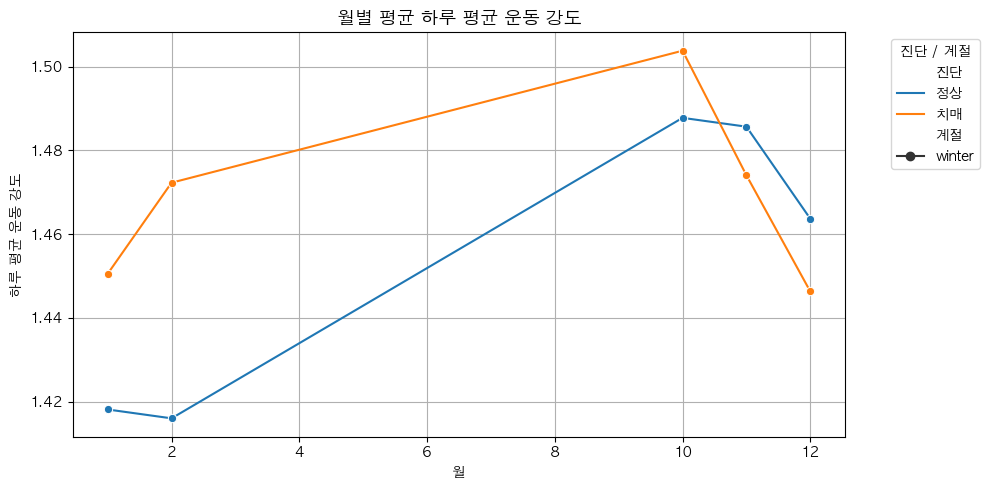

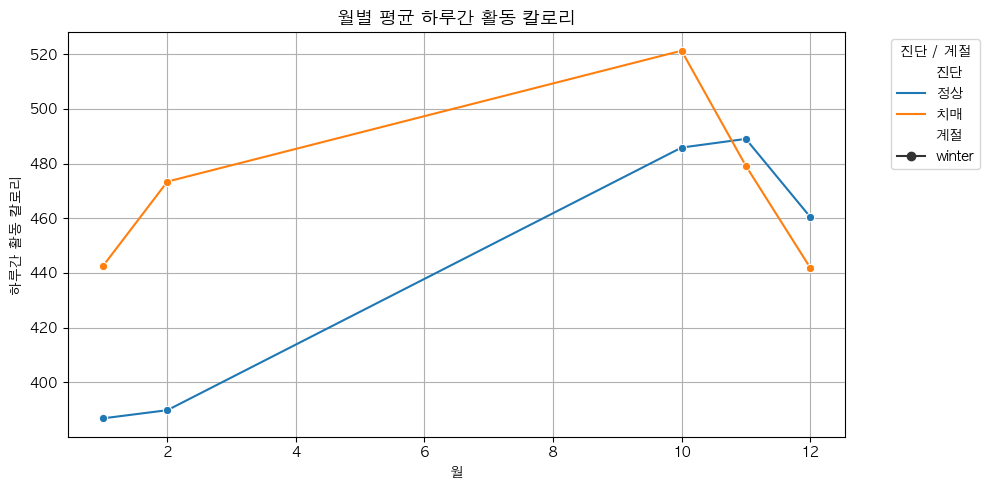

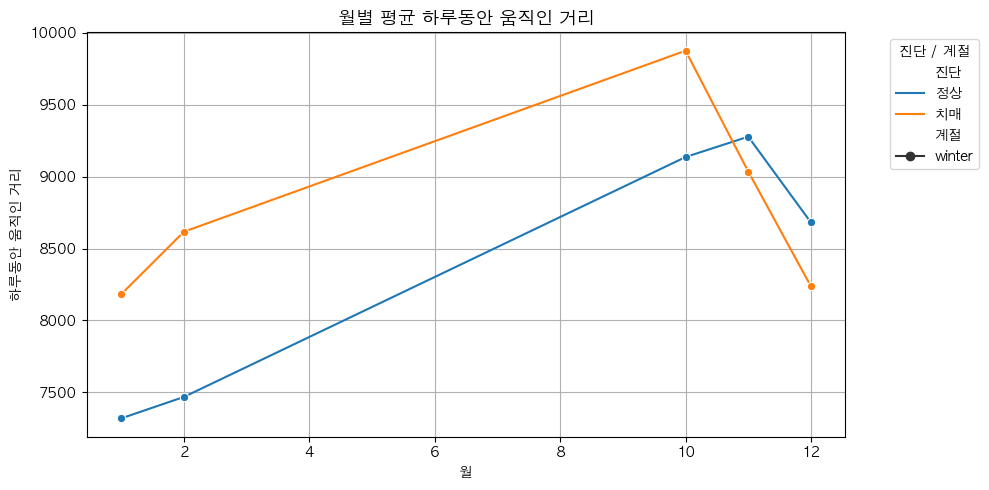

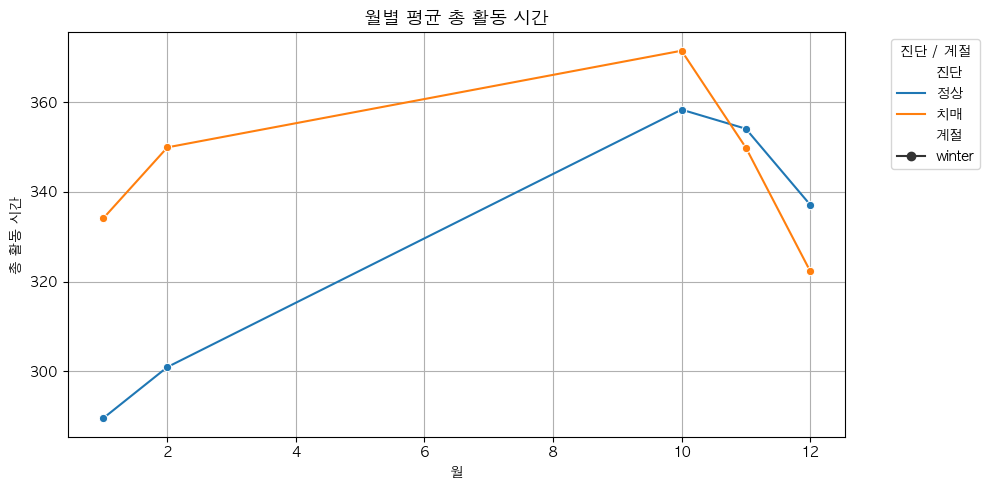

In [68]:
# 여름철 움직임이 많은 시간대 vs 겨울철 움직임이 많은 시간대?
# 여름은 5~9월 / 겨울 else (하루동안 움직인 거리, 활동 총 시간(저강도~고강도), 하루 평균 운동 강도, 하루간 활동 칼로리)
# 활동 시작 시간 기준으로 '월'
act['월'] = act['활동 시작 시간'].dt.month
act['계절'] = act['활동 시작 시간'].dt.month.map(
    lambda x: 'summer' if 5 <= x <= 9 else 'winter'
)


seasonal_act = ['하루 평균 운동 강도', '하루간 활동 칼로리', '하루동안 움직인 거리', '총 활동 시간']

for col in seasonal_act:
    group = act.groupby(['월', '계절', '진단'])[col].mean().reset_index()

    plt.figure(figsize=(10, 5))
    sns.lineplot(
        data=group,
        x='월',
        y=col,
        hue='진단',
        style='계절',
        markers=True,
        dashes=True
    )

    plt.title(f'월별 평균 {col}', fontsize=13)
    plt.xlabel('월')
    plt.ylabel(col)
    plt. legend(title='진단 / 계절', bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.grid(True)
    plt.tight_layout()
    plt.show()

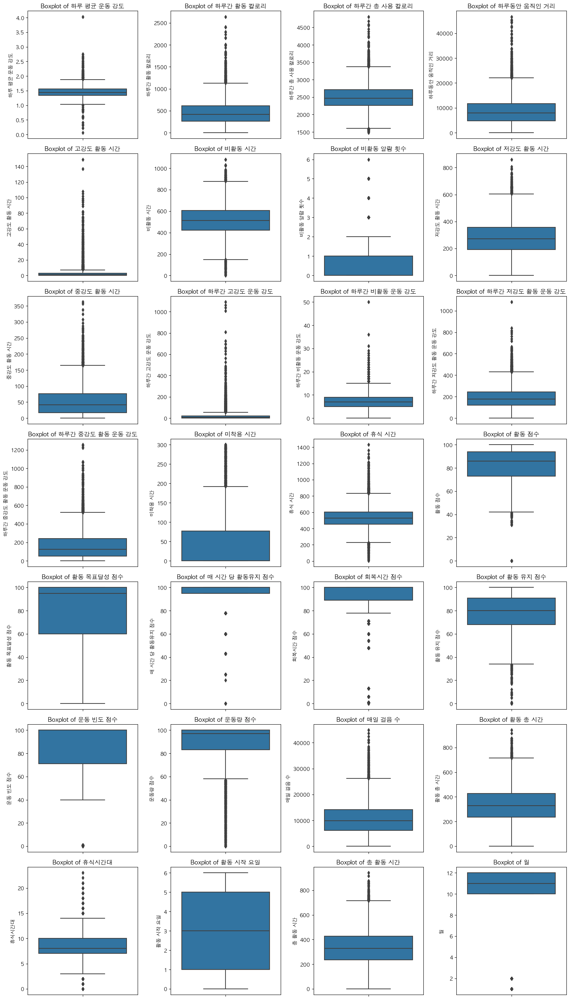

In [69]:
numeric_columns = act.select_dtypes(include='number').columns.tolist()

n_cols = 4
n_rows = (len(numeric_columns) + n_cols - 1) // n_cols

fig, axes = plt.subplots(n_rows, n_cols, figsize=(4 * n_cols, 4 * n_rows))
axes = axes.flatten()

for i, col in enumerate(numeric_columns):
    sns.boxplot(y=act[col], ax=axes[i])
    axes[i].set_title(f'Boxplot of {col}')

# 남는 subplot 제거
for j in range(i + 1, len(axes)):
    axes[j].axis('off')

plt.tight_layout()
plt.show()